# Pima Indians diabetes mellitus classification based on machine learning (ML) algorthims

## Project task

Na prvom roku predaje se očekuje da pripremite podatke iz danog skupa (učitati podatke, deskriptivna statistika, pozabaviti se nedostajućim/čudnim vrijednostima, pogledati koliko podataka uopće ima, kakvi su tipovi podataka, itd.) i malo ih vizualizirate (Primjeri: korelacijska matrica, scatter plot za neke zanimljive parove značajki, ...) . Rok za predaju prvog dijela projekta je 19.01.2024. i maksimalan broj bodova koji možete ostvariti je 20. 

U drugoj fazi projekta replicirate rezultate iz članka (implementacija prediktivnih modela iz članka, usporedba rezultata, ...). Kao što je spomenuto i u dokumentu s uputama za projekt, ova faza projekta je značajno teža od prve pa to svakako imajte na umu ako planirate ići na predaju i ovog dijela. Rok za predaju drugog dijela projekta je 24.01.2024. i maksimalan broj bodova koji možete ostvariti je 5. 

In [2]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import shap
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, roc_curve
from sklearn.metrics import ConfusionMatrixDisplay
from imblearn.metrics import specificity_score
from explainerdashboard import ClassifierExplainer, ExplainerDashboard
from IPython.display import Image


In [3]:
df = pd.read_csv('diabetes.csv')

In [4]:
df.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1


In [5]:
df.info()

# 9 columns (8 characterics + 1 corresponding clf), 768 rows
# data types can be seen

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Pregnancies               768 non-null    int64  
 1   Glucose                   768 non-null    int64  
 2   BloodPressure             768 non-null    int64  
 3   SkinThickness             768 non-null    int64  
 4   Insulin                   768 non-null    int64  
 5   BMI                       768 non-null    float64
 6   DiabetesPedigreeFunction  768 non-null    float64
 7   Age                       768 non-null    int64  
 8   Outcome                   768 non-null    int64  
dtypes: float64(2), int64(7)
memory usage: 54.1 KB


In [6]:
# but also...

df.dtypes

Pregnancies                   int64
Glucose                       int64
BloodPressure                 int64
SkinThickness                 int64
Insulin                       int64
BMI                         float64
DiabetesPedigreeFunction    float64
Age                           int64
Outcome                       int64
dtype: object

From the article:

Preg - Number of times pregnant Numeric [0, 17]

Gluc - Plasma glucose concentration at 2 Hours in an oral glucose tolerance test (GTIT) Numeric [0, 199]

BP - Diastolic Blood Pressure (mm Hg) Numeric [0, 122]

Skin - Triceps skin fold thickness (mm) Numeric [0, 99]

Insulin - 2-Hour Serum insulin (lh/ml) Numeric [0, 846]

BMI - Body mass index [weight in kg/(Height in m)] Numeric [0, 67.1]

DPF - Diabetes pedigree function Numeric [0.078, 2.42]

Age - Age (years) Numeric [21, 81]

Outcome - Binary value indicating non-diabetic /diabetic Factor [0,1]

In [7]:
df.Outcome.value_counts()
# 0 - negative test for diabetes, 1 - positive test for diabetes

Outcome
0    500
1    268
Name: count, dtype: int64

<Axes: ylabel='Outcome'>

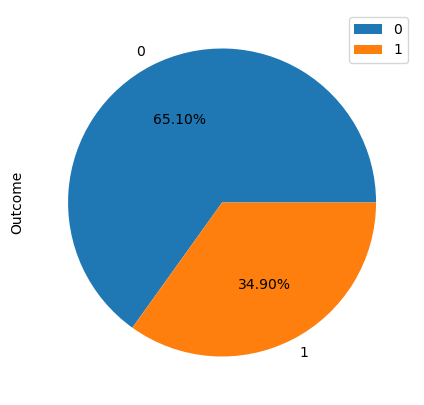

In [8]:
plt.figure(figsize=(5,5))
df["Outcome"].value_counts().plot(kind="pie", legend=True, autopct='%.2f%%', ylabel='Outcome')

In [9]:
# checking range of data

def minMax(x):
    return pd.Series(index=['min','max'], data=[x.min(),x.max()])

df.apply(minMax)

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
min,0,0,0,0,0,0.0,0.078,21,0
max,17,199,122,99,846,67.1,2.420,81,1


In [10]:
df.describe()

# descriptive statistics

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
count,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000
mean,3.845052,120.894531,69.105469,20.536458,79.799479,31.992578,0.471876,33.240885,0.348958
std,3.369578,31.972618,19.355807,15.952218,115.244002,7.884160,0.331329,11.760232,0.476951
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.078000,21.000000,0.000000
25%,1.000000,99.000000,62.000000,0.000000,0.000000,27.300000,0.243750,24.000000,0.000000
50%,3.000000,117.000000,72.000000,23.000000,30.500000,32.000000,0.372500,29.000000,0.000000
75%,6.000000,140.250000,80.000000,32.000000,127.250000,36.600000,0.626250,41.000000,1.000000
max,17.000000,199.000000,122.000000,99.000000,846.000000,67.100000,2.420000,81.000000,1.000000


In [11]:
# checking monotonous values

df.nunique()

Pregnancies                  17
Glucose                     136
BloodPressure                47
SkinThickness                51
Insulin                     186
BMI                         248
DiabetesPedigreeFunction    517
Age                          52
Outcome                       2
dtype: int64

Dataset has no monotonous attributes.

In [12]:
# checking missing values

df.isna().sum()

Pregnancies                 0
Glucose                     0
BloodPressure               0
SkinThickness               0
Insulin                     0
BMI                         0
DiabetesPedigreeFunction    0
Age                         0
Outcome                     0
dtype: int64

Dataset has no apparent missing values.

Inconsistent (weird) values do exist.

From the article:

However, according to domain knowledge [32], there are inconsistent values for the attributes: glucose concentration (Gluc), blood pressure (BP), skin fold thickness (Skin), insulin and BMI, whereby zero values are not within the
 normal range and are therefore inaccurate (Table 2).

In [13]:
for col in ['Glucose', 'BloodPressure', 'SkinThickness', 'Insulin', 'BMI']:
    print(f'{col} has {df[col].value_counts()[0]} zeros')

Glucose has 5 zeros
BloodPressure has 35 zeros
SkinThickness has 227 zeros
Insulin has 374 zeros
BMI has 11 zeros


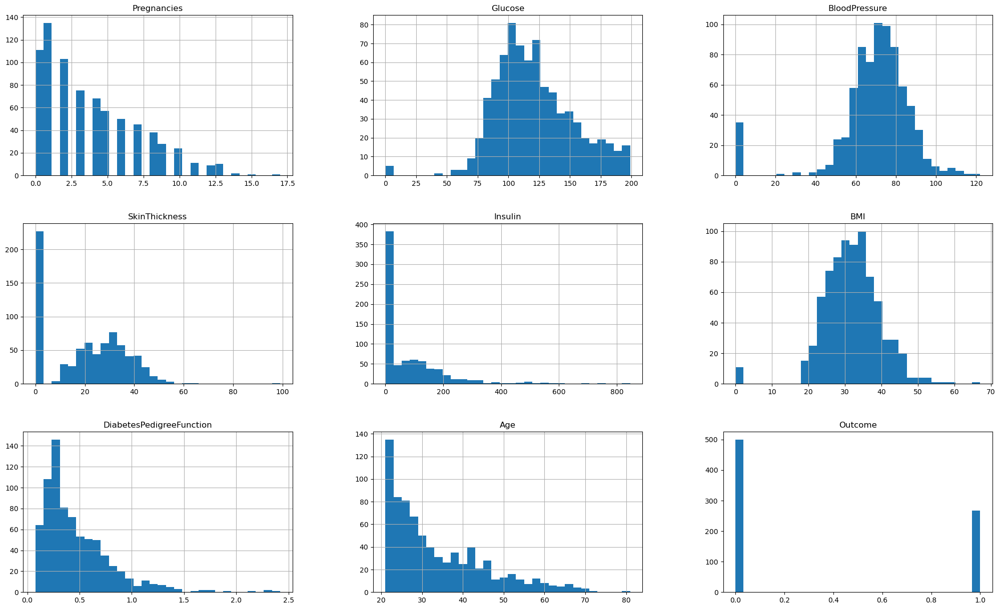

In [14]:
# visualization

df.hist(bins=30, figsize=(25, 15))
plt.grid()
plt.show()

From the article:

Since there were no missing or null values, only one
data pre-processing technique was applied in the first
round. This was to impute the median value on the features
that had invalid zero values.

In [15]:
df_pp = df.copy()

In [16]:
for col in ['Glucose', 'BloodPressure', 'SkinThickness', 'Insulin', 'BMI']:
    df_pp[col] = df_pp[col].replace(0, df_pp[col].median())

In [17]:
df_pp.describe()

# no zeros anymore

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
count,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000
mean,3.845052,121.656250,72.386719,27.334635,94.652344,32.450911,0.471876,33.240885,0.348958
std,3.369578,30.438286,12.096642,9.229014,105.547598,6.875366,0.331329,11.760232,0.476951
min,0.000000,44.000000,24.000000,7.000000,14.000000,18.200000,0.078000,21.000000,0.000000
25%,1.000000,99.750000,64.000000,23.000000,30.500000,27.500000,0.243750,24.000000,0.000000
50%,3.000000,117.000000,72.000000,23.000000,31.250000,32.000000,0.372500,29.000000,0.000000
75%,6.000000,140.250000,80.000000,32.000000,127.250000,36.600000,0.626250,41.000000,1.000000
max,17.000000,199.000000,122.000000,99.000000,846.000000,67.100000,2.420000,81.000000,1.000000


In [18]:
df_pp[df_pp["Pregnancies"] > 10].value_counts().sum()

34

In [19]:
df_pp[df_pp["Pregnancies"] > 15].value_counts().sum()

1

Such large number of pregnancies is also a bit weird, but no modifications of this type have been mentioned in the paper, so I will leave it like that.

Text(0.5, 1.0, 'Patients with diabetes')

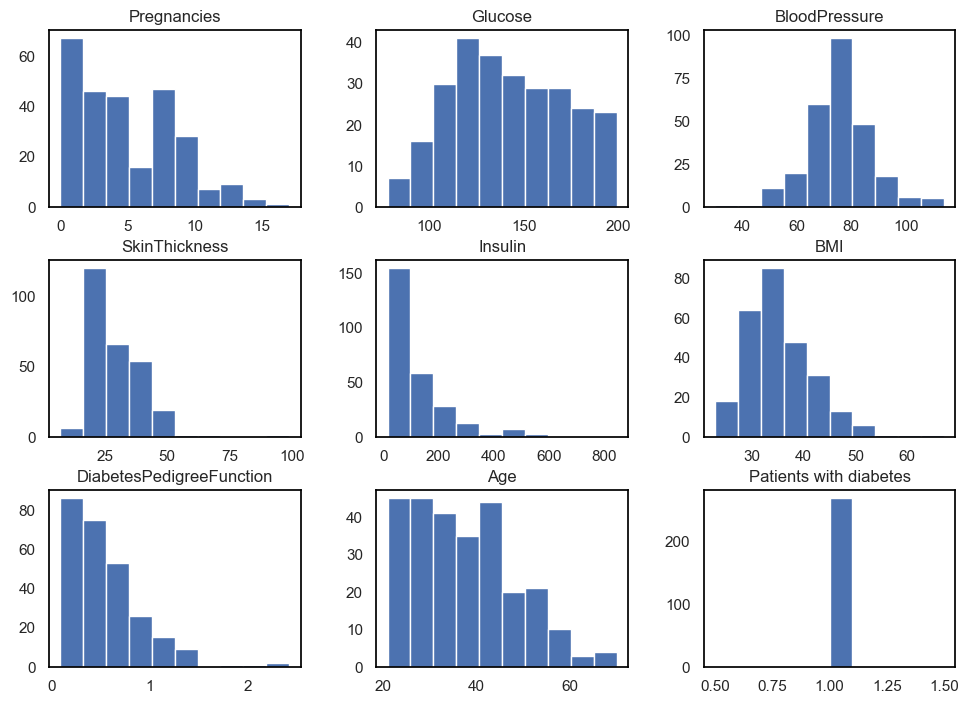

In [76]:
df_pp[df_pp["Outcome"]==1].hist()
plt.title('Patients with diabetes')

# data distribution for patients with diabetes

In [21]:
df.corr()

# correlation matrix of the unaltered dataset

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
Pregnancies,1.000000,0.129459,0.141282,-0.081672,-0.073535,0.017683,-0.033523,0.544341,0.221898
Glucose,0.129459,1.000000,0.152590,0.057328,0.331357,0.221071,0.137337,0.263514,0.466581
BloodPressure,0.141282,0.152590,1.000000,0.207371,0.088933,0.281805,0.041265,0.239528,0.065068
SkinThickness,-0.081672,0.057328,0.207371,1.000000,0.436783,0.392573,0.183928,-0.113970,0.074752
Insulin,-0.073535,0.331357,0.088933,0.436783,1.000000,0.197859,0.185071,-0.042163,0.130548
BMI,0.017683,0.221071,0.281805,0.392573,0.197859,1.000000,0.140647,0.036242,0.292695
DiabetesPedigreeFunction,-0.033523,0.137337,0.041265,0.183928,0.185071,0.140647,1.000000,0.033561,0.173844
Age,0.544341,0.263514,0.239528,-0.113970,-0.042163,0.036242,0.033561,1.000000,0.238356
Outcome,0.221898,0.466581,0.065068,0.074752,0.130548,0.292695,0.173844,0.238356,1.000000


In [22]:
df_pp.corr() 

# correlation matrix of the altered dataset (for the first round of experiments - zeros changed with median)

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
Pregnancies,1.000000,0.128213,0.208615,0.032568,-0.055697,0.021546,-0.033523,0.544341,0.221898
Glucose,0.128213,1.000000,0.218937,0.172143,0.357573,0.231400,0.137327,0.266909,0.492782
BloodPressure,0.208615,0.218937,1.000000,0.147809,-0.028721,0.281132,-0.002378,0.324915,0.165723
SkinThickness,0.032568,0.172143,0.147809,1.000000,0.238188,0.546951,0.142977,0.054514,0.189065
Insulin,-0.055697,0.357573,-0.028721,0.238188,1.000000,0.189022,0.178029,-0.015413,0.148457
BMI,0.021546,0.231400,0.281132,0.546951,0.189022,1.000000,0.153506,0.025744,0.312249
DiabetesPedigreeFunction,-0.033523,0.137327,-0.002378,0.142977,0.178029,0.153506,1.000000,0.033561,0.173844
Age,0.544341,0.266909,0.324915,0.054514,-0.015413,0.025744,0.033561,1.000000,0.238356
Outcome,0.221898,0.492782,0.165723,0.189065,0.148457,0.312249,0.173844,0.238356,1.000000


<Axes: >

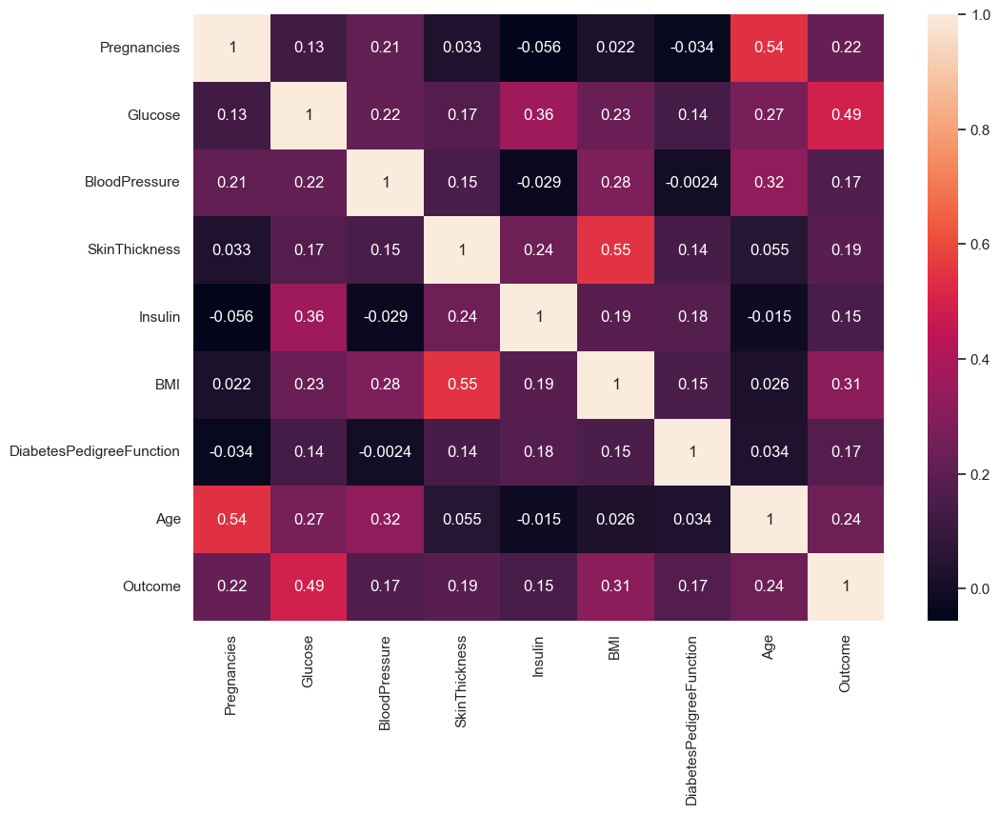

In [23]:
sns.set(rc={'figure.figsize':(11.7,8.27)})
sns.heatmap(df_pp.corr(), annot=True)

Glucose, BMI and Age have the highest correlation with Outcome. I will make few visualizations to try to draw some conclusions.

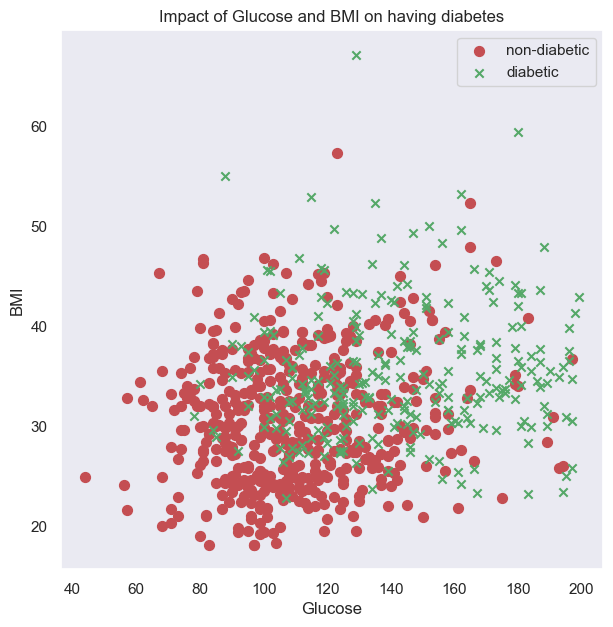

In [24]:
mask_outcome = df_pp.Outcome == 1

# plot
plt.figure(figsize=(7,7))
plt.scatter(df_pp.loc[~mask_outcome,'Glucose'], df_pp.loc[~mask_outcome,'BMI'], s=50, alpha=1, c='r', label='non-diabetic')
plt.scatter(df_pp.loc[mask_outcome,'Glucose'], df_pp.loc[mask_outcome,'BMI'], alpha=1, marker='x', c='g', label='diabetic')
plt.xlabel('Glucose')
plt.ylabel('BMI')
plt.title('Impact of Glucose and BMI on having diabetes')
plt.grid()
plt.legend(loc='best')
plt.show()

Higher Glucose concentration means higher chance for obtaining diabetes no matter the BMI.

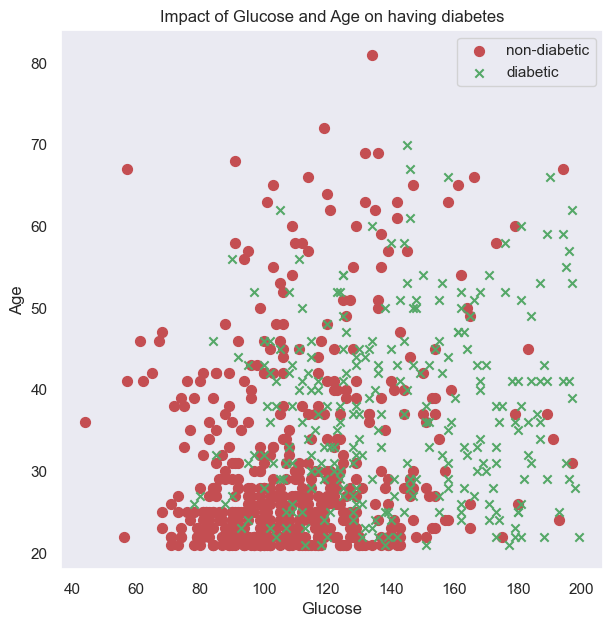

In [25]:
plt.figure(figsize=(7,7))
plt.scatter(df_pp.loc[~mask_outcome,'Glucose'], df_pp.loc[~mask_outcome,'Age'], s=50, alpha=1, c='r', label='non-diabetic')
plt.scatter(df_pp.loc[mask_outcome,'Glucose'], df_pp.loc[mask_outcome,'Age'], alpha=1, marker='x', c='g', label='diabetic')
plt.xlabel('Glucose')
plt.ylabel('Age')
plt.title('Impact of Glucose and Age on having diabetes')
plt.grid()
plt.legend(loc='best')
plt.show()

Higher Glucose concentration means higher chance for obtaining diabetes no matter the Age.

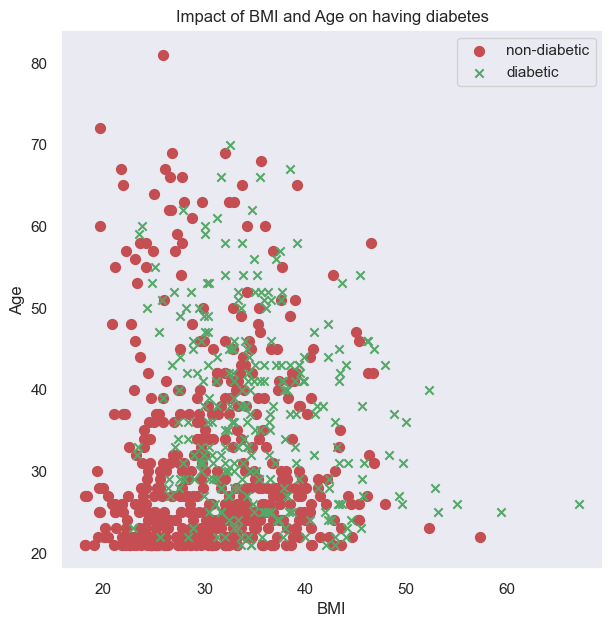

In [26]:
plt.figure(figsize=(7,7))
plt.scatter(df_pp.loc[~mask_outcome,'BMI'], df_pp.loc[~mask_outcome,'Age'], s=50, alpha=1, c='r', label='non-diabetic')
plt.scatter(df_pp.loc[mask_outcome,'BMI'], df_pp.loc[mask_outcome,'Age'], alpha=1, marker='x', c='g', label='diabetic')
plt.xlabel('BMI')
plt.ylabel('Age')
plt.title('Impact of BMI and Age on having diabetes')
plt.grid()
plt.legend(loc='best')
plt.show()

Lower BMI indicates lower probability of obtaining diabetes no matter the Age.

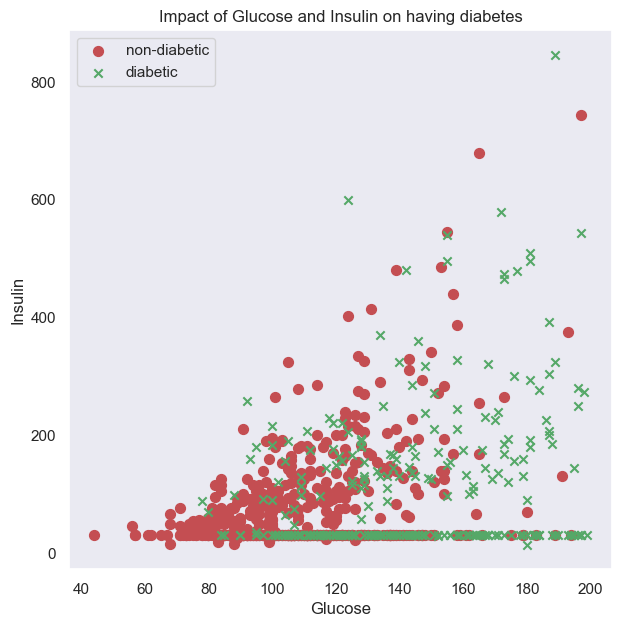

In [27]:
# plot
plt.figure(figsize=(7,7))
plt.scatter(df_pp.loc[~mask_outcome,'Glucose'], df_pp.loc[~mask_outcome,'Insulin'], s=50, alpha=1, c='r', label='non-diabetic')
plt.scatter(df_pp.loc[mask_outcome,'Glucose'], df_pp.loc[mask_outcome,'Insulin'], alpha=1, marker='x', c='g', label='diabetic')
plt.xlabel('Glucose')
plt.ylabel('Insulin')
plt.title('Impact of Glucose and Insulin on having diabetes')
plt.grid()
plt.legend(loc='best')
plt.show()

Higher Glucose - higher Insulin - more diabetes.

Next plot shows how many people diagnosed with diabetes have certain age.

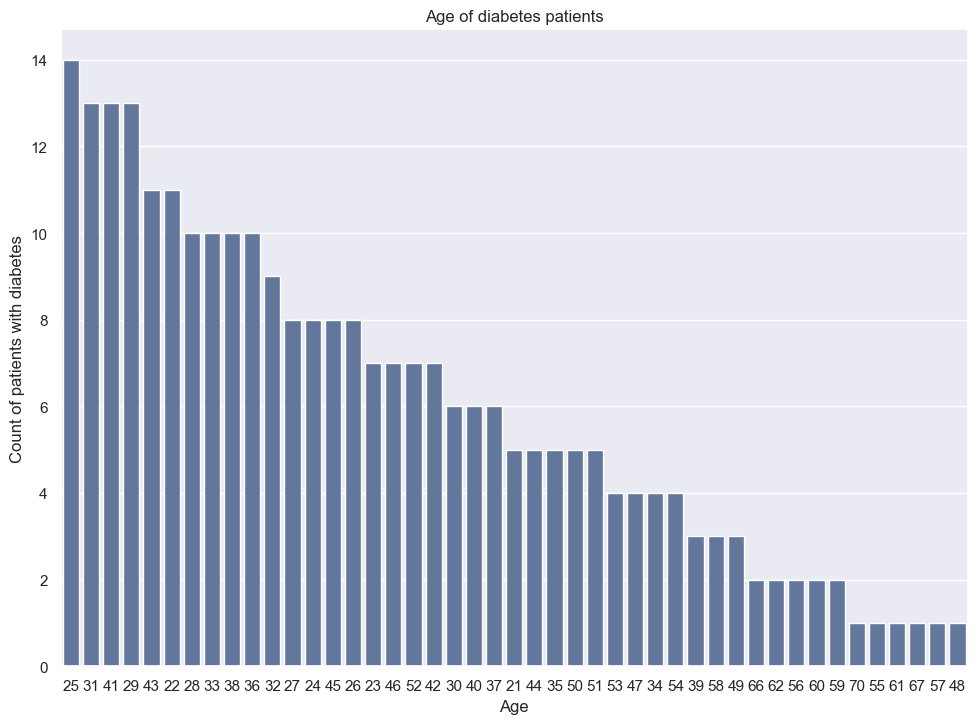

In [28]:
sns.countplot(x='Age', data=df_pp[df_pp['Outcome'] == 1], color='#5975a4', order=df_pp[df_pp['Outcome'] == 1]['Age'].value_counts().index)
plt.title('Age of diabetes patients')
plt.xlabel('Age')
plt.ylabel('Count of patients with diabetes')
plt.show()

Figure 4 and Figure 5 in the paper are done for the original (unaltered) dataset. However, I will show the graphs for the altered version also to visualize the changes made (zeros replaced with median).

C:\Users\Ivana\anaconda3\envs\proba1\lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


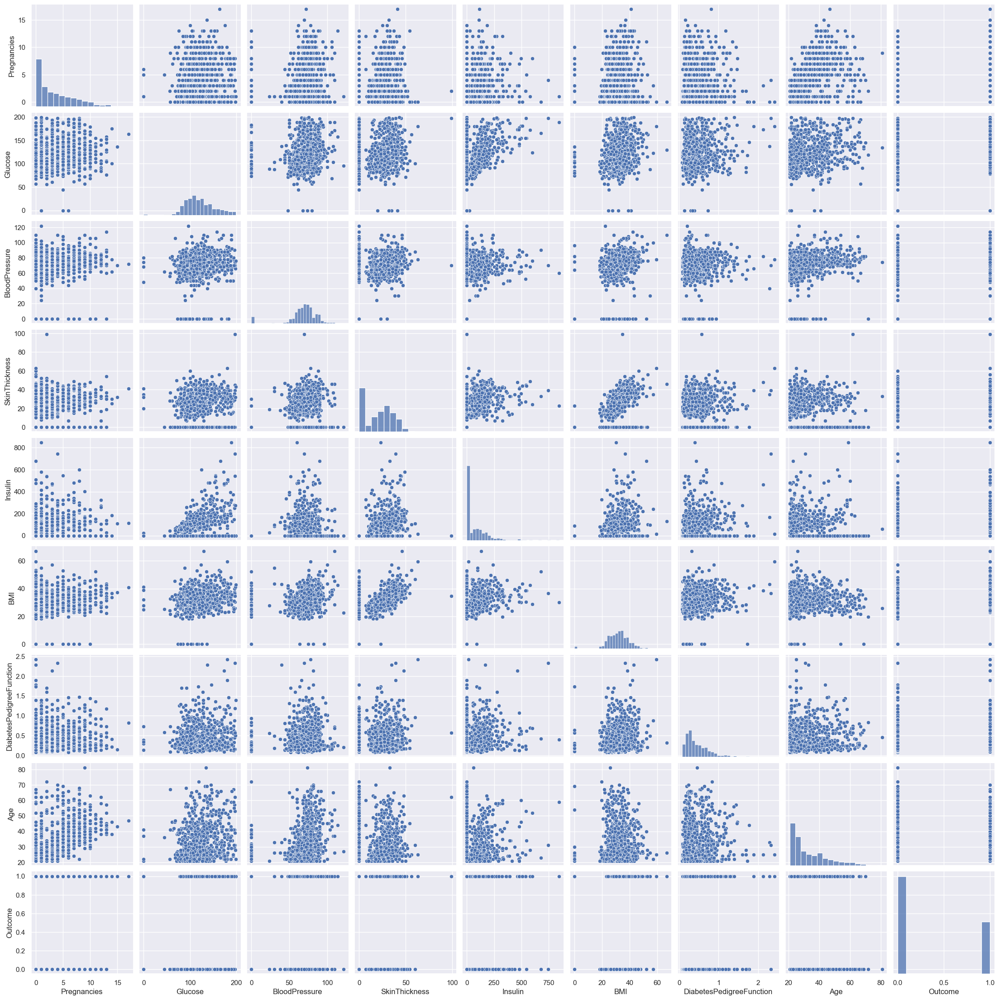

In [28]:
sns.set(rc={'figure.figsize':(25,15)})
sns.pairplot(df.loc[:,:])
plt.show()

C:\Users\Ivana\anaconda3\envs\proba1\lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


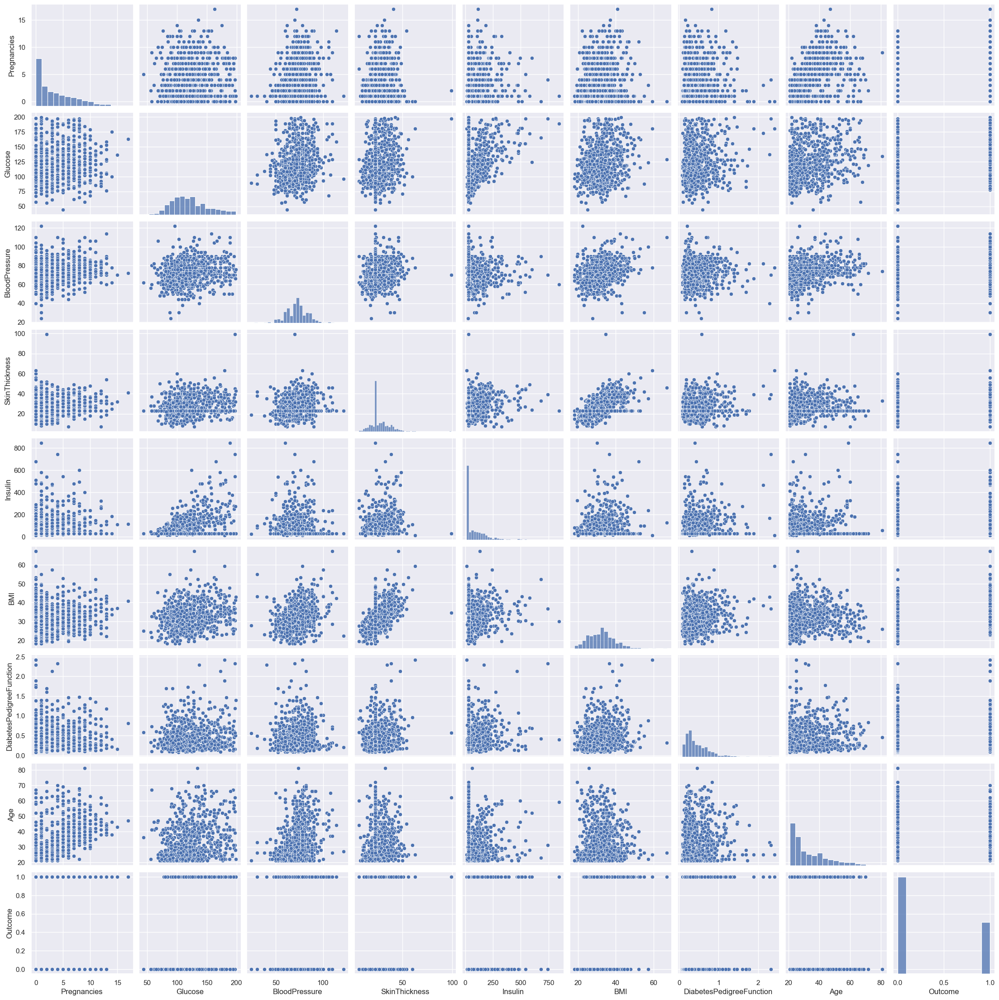

In [29]:
sns.set(rc={'figure.figsize':(25,15)})
sns.pairplot(df_pp.loc[:,:])
plt.show()

C:\Users\Ivana\anaconda3\envs\proba1\lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


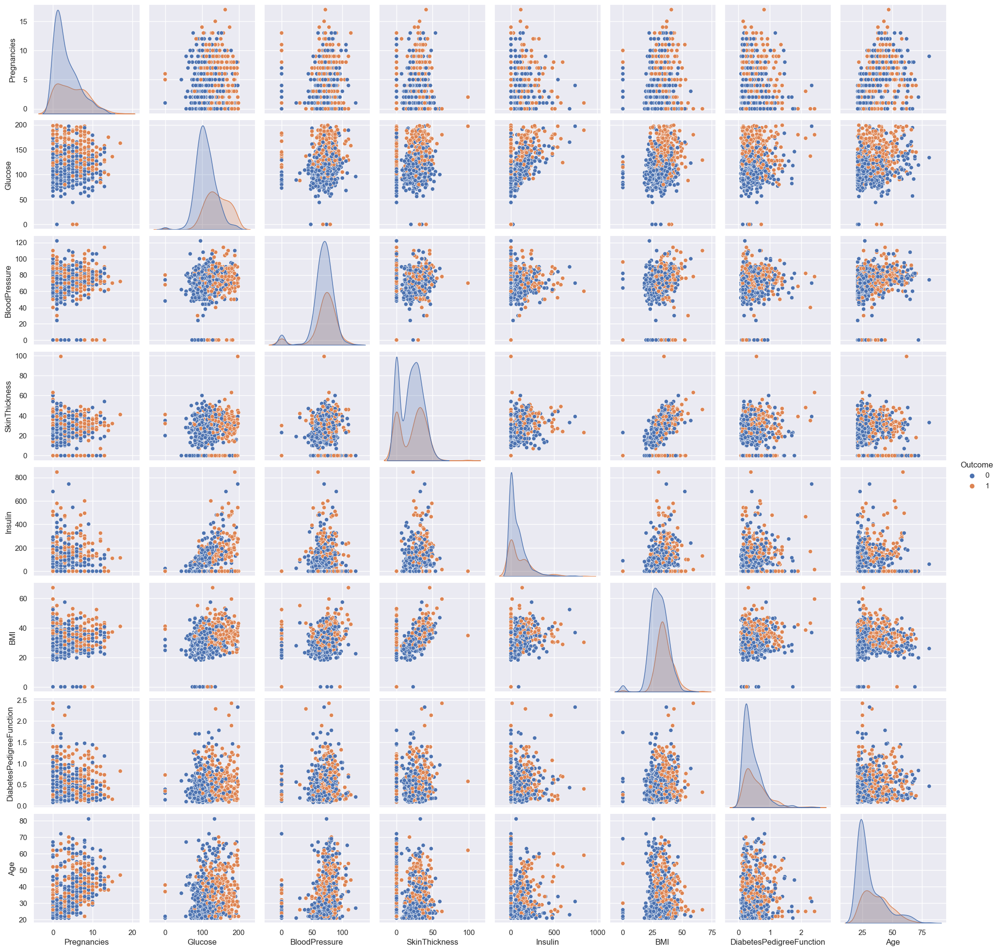

In [30]:
sns.set(rc={'figure.figsize':(25,15)})
sns.pairplot(df.loc[:,:], hue='Outcome') # with hue
plt.show()

C:\Users\Ivana\anaconda3\envs\proba1\lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


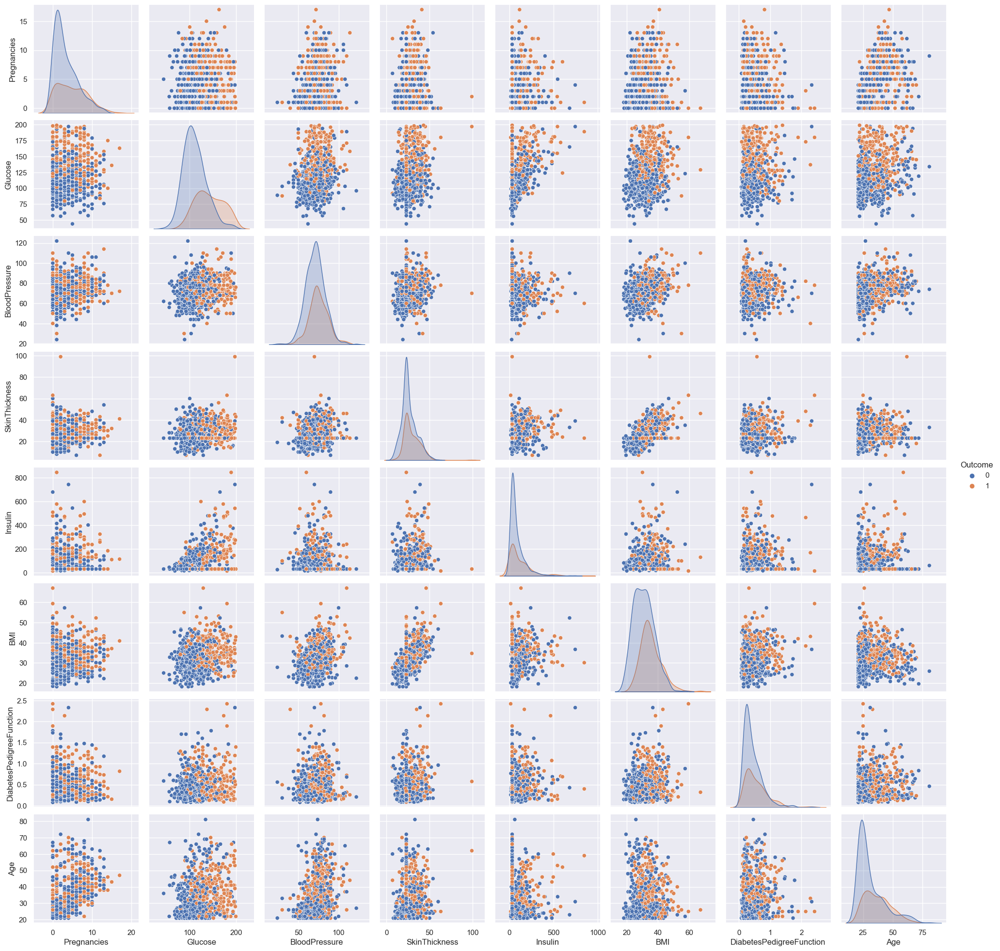

In [31]:
sns.set(rc={'figure.figsize':(25,15)})
sns.pairplot(df_pp.loc[:,:], hue='Outcome') # with hue
plt.show()

Paraphrase from the text:

Scattered points indicate that there is no obvious relationship. If the points are roughly arranged in a straight line, it
means that they are linearly related. 

The most closely correlated/proportional features include [Pregnancy and Age], [Skin Thickness and BMI], and [Glucose and Insulin] because their scatterplot figures all show a positive correlation.

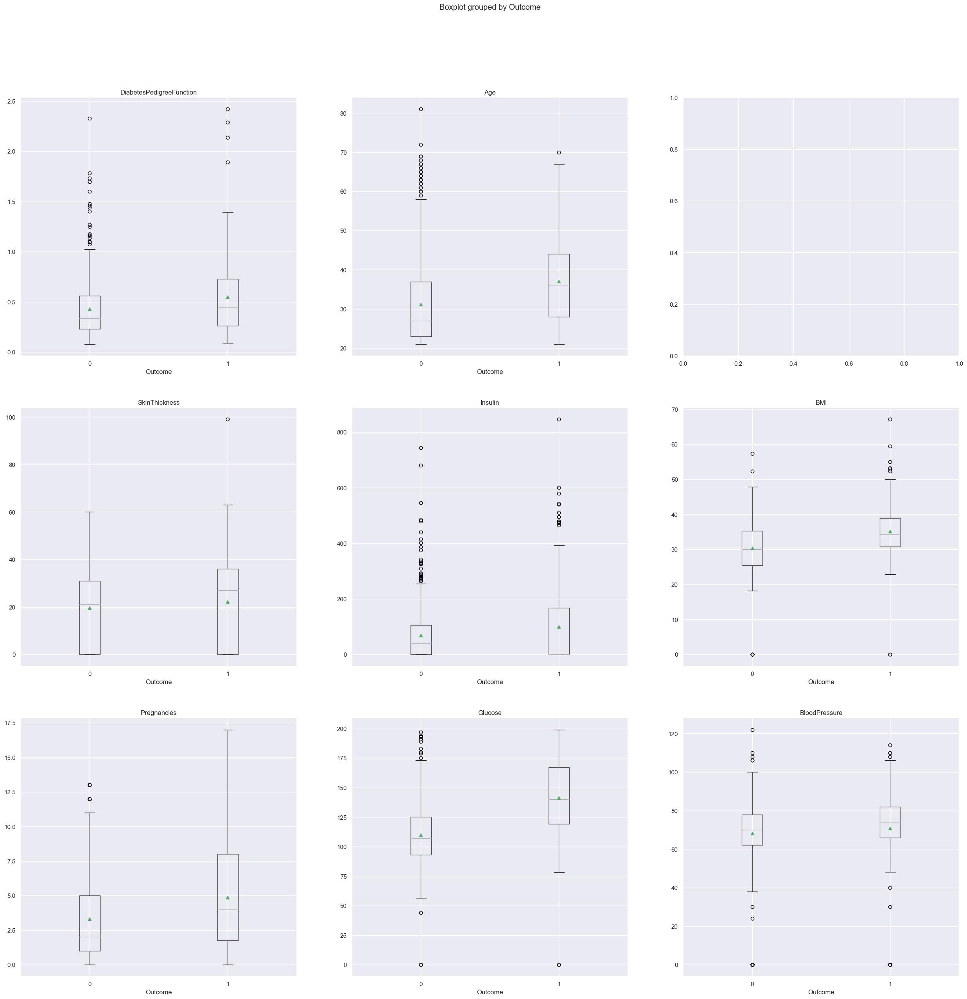

In [32]:
fig, axes = plt.subplots(3,3, figsize=(30,30)) 

df.boxplot(by='Outcome', column='DiabetesPedigreeFunction', ax=axes.flatten()[0], showmeans=True)
df.boxplot(by='Outcome', column='Age', ax=axes.flatten()[1], showmeans=True)
df.boxplot(by='Outcome', column='SkinThickness', ax=axes.flatten()[3], showmeans=True)
df.boxplot(by='Outcome', column='Insulin', ax=axes.flatten()[4], showmeans=True)
df.boxplot(by='Outcome', column='BMI', ax=axes.flatten()[5], showmeans=True)
df.boxplot(by='Outcome', column='Pregnancies', ax=axes.flatten()[6], showmeans=True)
df.boxplot(by='Outcome', column='Glucose', ax=axes.flatten()[7], showmeans=True)
df.boxplot(by='Outcome', column='BloodPressure', ax=axes.flatten()[8], showmeans=True)
plt.show()


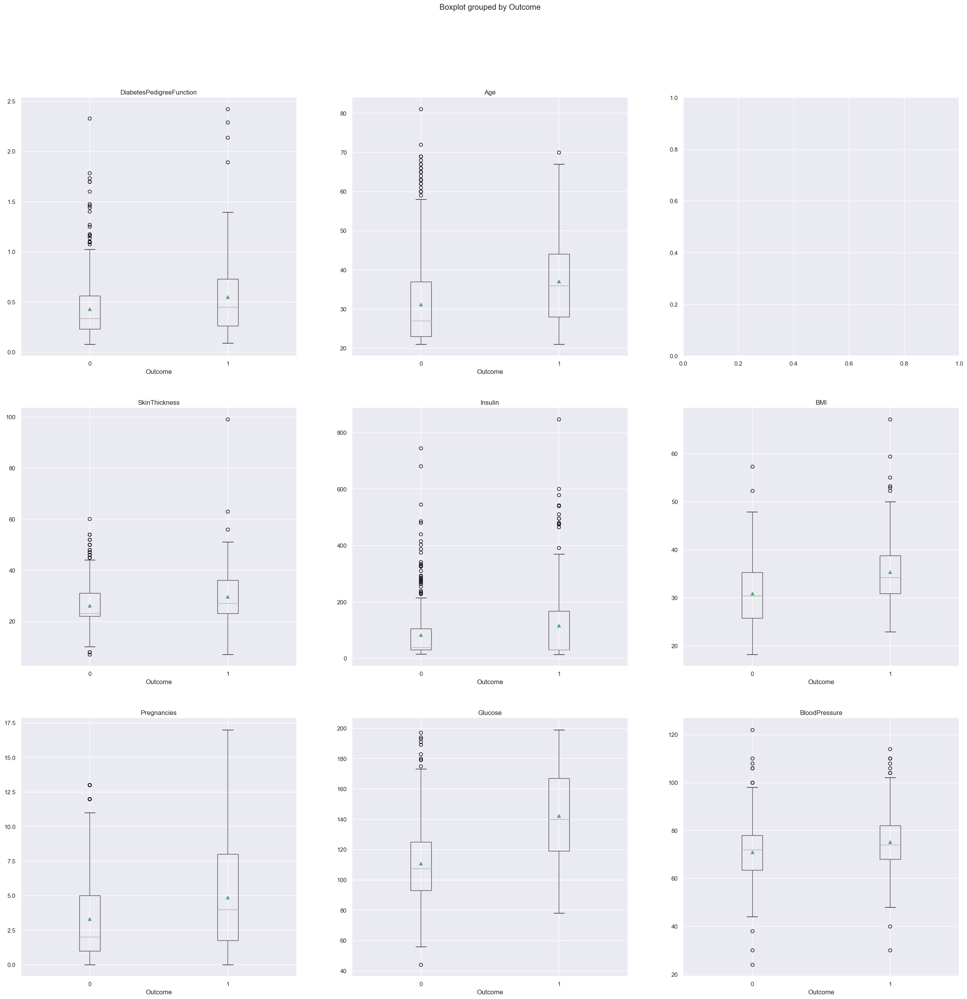

In [33]:
fig, axes = plt.subplots(3,3, figsize=(30,30)) 

df_pp.boxplot(by='Outcome', column='DiabetesPedigreeFunction', ax=axes.flatten()[0], showmeans=True)
df_pp.boxplot(by='Outcome', column='Age', ax=axes.flatten()[1], showmeans=True)
df_pp.boxplot(by='Outcome', column='SkinThickness', ax=axes.flatten()[3], showmeans=True)
df_pp.boxplot(by='Outcome', column='Insulin', ax=axes.flatten()[4], showmeans=True)
df_pp.boxplot(by='Outcome', column='BMI', ax=axes.flatten()[5], showmeans=True)
df_pp.boxplot(by='Outcome', column='Pregnancies', ax=axes.flatten()[6], showmeans=True)
df_pp.boxplot(by='Outcome', column='Glucose', ax=axes.flatten()[7], showmeans=True)
df_pp.boxplot(by='Outcome', column='BloodPressure', ax=axes.flatten()[8], showmeans=True)
plt.show()

From the text:

As shown in Fig. 5, there are outliers in DPF, age,
insulin, glucose, BMI, and blood pressure features, which
might be due to other underlying factors. It would be best
to standardize the data to avoid the ill effects of the outliers.
The dataset is not a very large one, so it would be
better to avoid removing rows unnecessarily.

In [29]:
# standardization

x = df_pp.loc[:, ~df_pp.columns.isin(['Outcome'])].values 
y = df.loc[:,['Outcome']].values
std_df_pp = StandardScaler().fit_transform(x)
print(std_df_pp.mean())
print(std_df_pp.std())

9.374734784757995e-17
1.0


Additionally, the violin plot has a similar shape to a traditional box plot (with the median and the upper and lower quartiles visible). Instead of a box, the violin plot uses a "violin" shape to represent the entire distribution of the data.

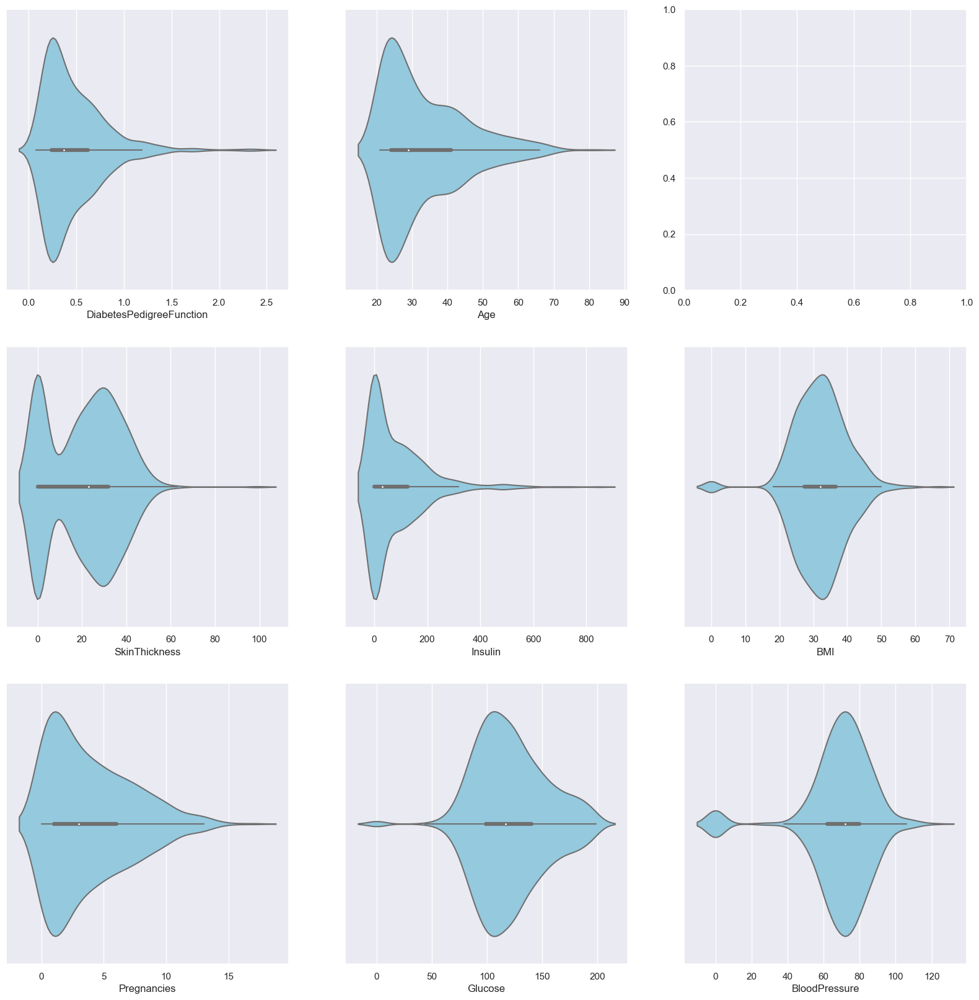

In [30]:
fig, ax = plt.subplots(nrows=3, ncols=3, figsize=(20,20))
sns.violinplot(x="DiabetesPedigreeFunction", data=df, ax=ax[0,0], color="skyblue")
sns.violinplot(x="Age", data=df, ax=ax[0,1], color="skyblue")
sns.violinplot (x ='SkinThickness', data=df, ax=ax[1,0], color="skyblue")
sns.violinplot(x='Insulin', data=df, ax=ax[1,1], color="skyblue")
sns.violinplot(x='BMI', data=df, ax=ax[1,2], color="skyblue")
sns.violinplot(x='Pregnancies', data=df, ax=ax[2,0], color="skyblue")
sns.violinplot(x='Glucose', data=df, ax=ax[2,1], color="skyblue")
sns.violinplot(x='BloodPressure', data=df, ax=ax[2,2], color="skyblue")
plt.show()

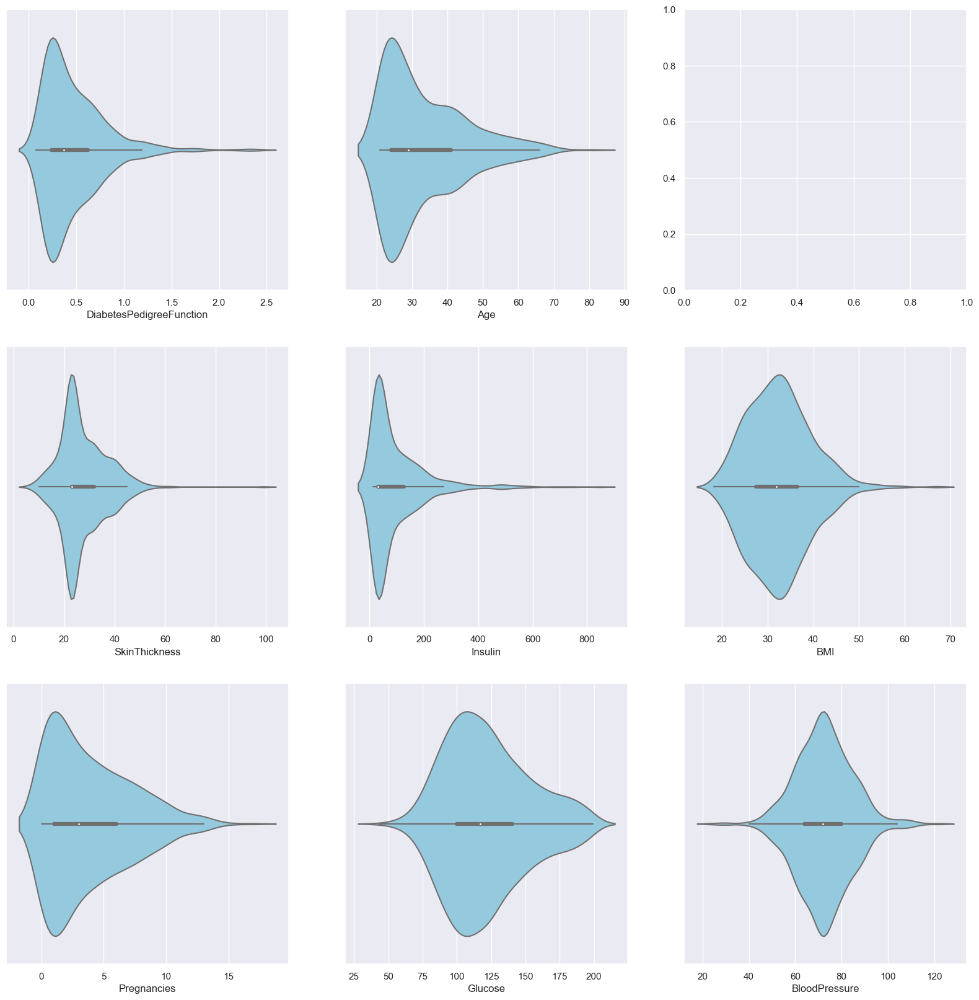

In [31]:
fig, ax = plt.subplots(nrows=3, ncols=3, figsize=(20,20))
sns.violinplot(x="DiabetesPedigreeFunction", data=df_pp, ax=ax[0,0], color="skyblue")
sns.violinplot(x="Age", data=df_pp, ax=ax[0,1], color="skyblue")
sns.violinplot (x ='SkinThickness', data=df_pp, ax=ax[1,0], color="skyblue")
sns.violinplot(x='Insulin', data=df_pp, ax=ax[1,1], color="skyblue")
sns.violinplot(x='BMI', data=df_pp, ax=ax[1,2], color="skyblue")
sns.violinplot(x='Pregnancies', data=df_pp, ax=ax[2,0], color="skyblue")
sns.violinplot(x='Glucose', data=df_pp, ax=ax[2,1], color="skyblue")
sns.violinplot(x='BloodPressure', data=df_pp, ax=ax[2,2], color="skyblue")
plt.show()

From the text:

With only eight features, it may seem counter-intuitive
to reduce the features further, but it can reduce some of the
noise in classification and pinpoint subtle groupings synthesized
by combining existing classes. In rounds two and three of experiments, the feature selection methodologies
that were employed included: PCA, k-means clustering,
and importance ranking.

For feature selection purposes within the
experiments with the machine learning models, this
research performs k-means clustering, principal component
analysis (PCA), and importance ranking on the dataset.

In [32]:
# standardization of the whole dataset - the results were not as in the paper if standardization done without Outcome

xy = df_pp.values 
std_df_pp = StandardScaler().fit_transform(xy)
print(std_df_pp.mean())
print(std_df_pp.std())

8.789265611615822e-17
1.0


In [33]:
std_df_pp.shape

(768, 9)

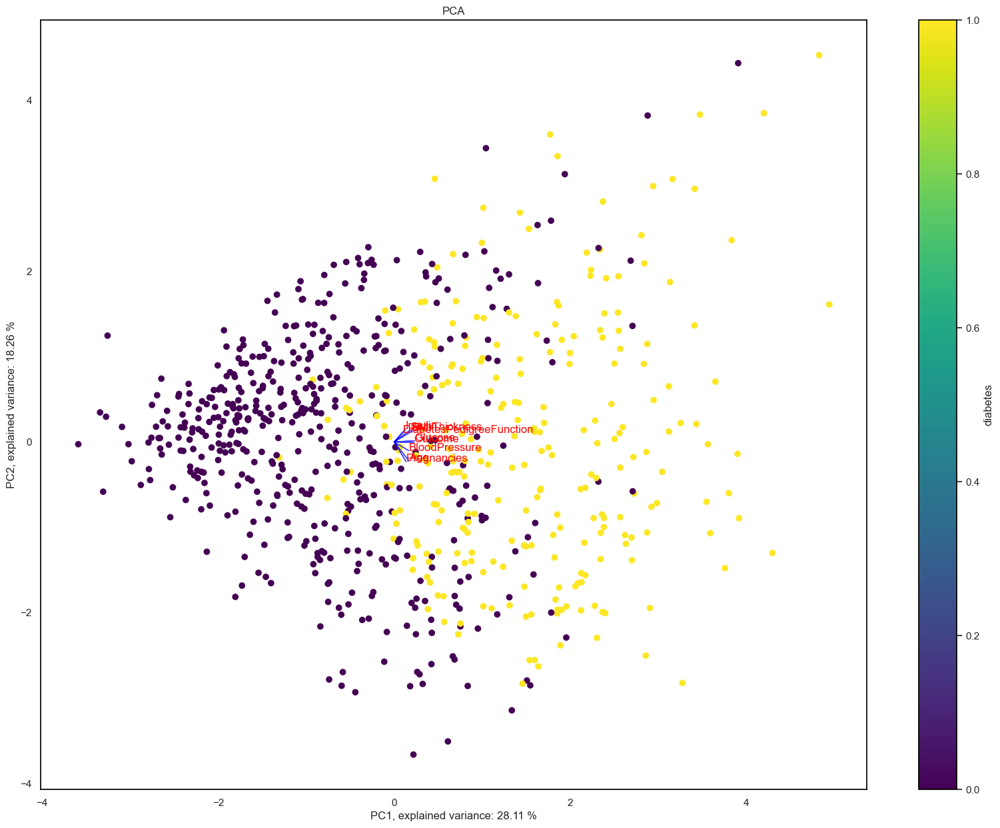

In [36]:
plt.rcParams.update({"axes.facecolor" : "white",
                    "axes.edgecolor":  "black"})
                     
pca = PCA(n_components=2)
principalComponents = pca.fit_transform(std_df_pp)


explained_variances = pca.explained_variance_ratio_
loadings = pca.components_.T * np.sqrt(explained_variances) #the principal component vectors (also known as loadings)

plt.figure(figsize=(20,15))
plt.scatter(principalComponents[:, 0], principalComponents[:, 1], c=df_pp['Outcome'], cmap='viridis')

for i, feature in enumerate(df_pp.columns):

    plt.annotate(feature, # variable name
                 (loadings[i, 0],
                  loadings[i, 1]),
                 color='red')
    
    plt.arrow(0, 0,
              loadings[i, 0],
              loadings[i, 1],
              color='blue',
              alpha=0.7, 
              width=0.001,
             )
    
plt.colorbar(label='diabetes')
plt.xlabel(f'PC1, explained variance: {explained_variances[0]*100:.2f} %')
plt.ylabel(f'PC2, explained variance: {explained_variances[1]*100:.2f} %')
plt.title('PCA')
plt.show()


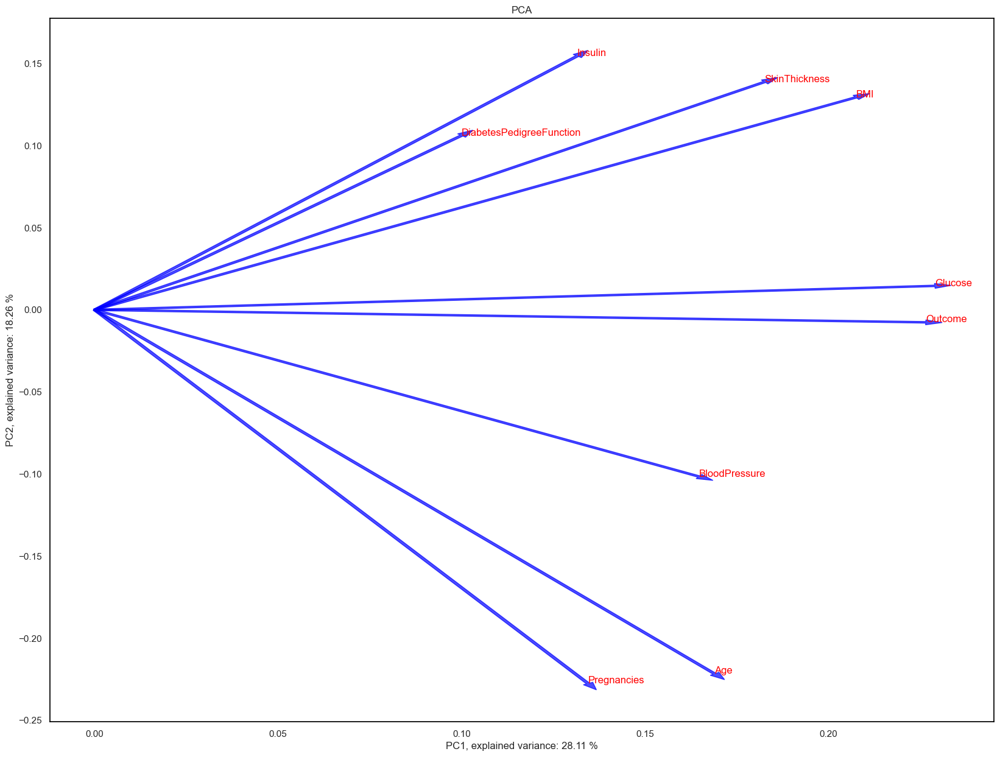

In [37]:
plt.figure(figsize=(20,15))
for i, feature in enumerate(df_pp.columns):

    plt.annotate(feature, # variable name
                 (loadings[i, 0],
                  loadings[i, 1]),
                 color='red')
    
    plt.arrow(0, 0,
              loadings[i, 0],
              loadings[i, 1],
              color='blue',
              alpha=0.7, 
              width=0.001,
             )
    
plt.xlabel(f'PC1, explained variance: {explained_variances[0]*100:.2f} %')
plt.ylabel(f'PC2, explained variance: {explained_variances[1]*100:.2f} %')
plt.title('PCA')
plt.show()

In [38]:
print(pca.explained_variance_) # returns a vector of the variance explained by each dimension
print(pca.explained_variance_ratio_) # the variance explained solely by the (i+1)st dimension.
print(pca.explained_variance_ratio_.cumsum())

[2.53286015 1.64591109]
[0.28106246 0.18264089]
[0.28106246 0.46370335]


Although the arrows are like multiplied with (-1) when comparing with the paper, similar close connections between the features can be seen.

Features that are closely related are:

- Pregnancies and Age,

- BMI, Diabetes Pedigree Function, Insulin and Skin Thickness.

However, the results here do not indicate close connection between Glucose and BloodPressure as in the paper.

From the paper:

Following this, k-means clustering was used where
various values of k were used and observed. According to
Fig. 7, we can see that k = 2 has the best separation of
boundaries or groupings, but k = 3 also has decent clustering
as well and could be useful.

C:\Users\Ivana\anaconda3\envs\proba1\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
C:\Users\Ivana\anaconda3\envs\proba1\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
C:\Users\Ivana\anaconda3\envs\proba1\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
C:\Users\Ivana\anaconda3\envs\proba1\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment 

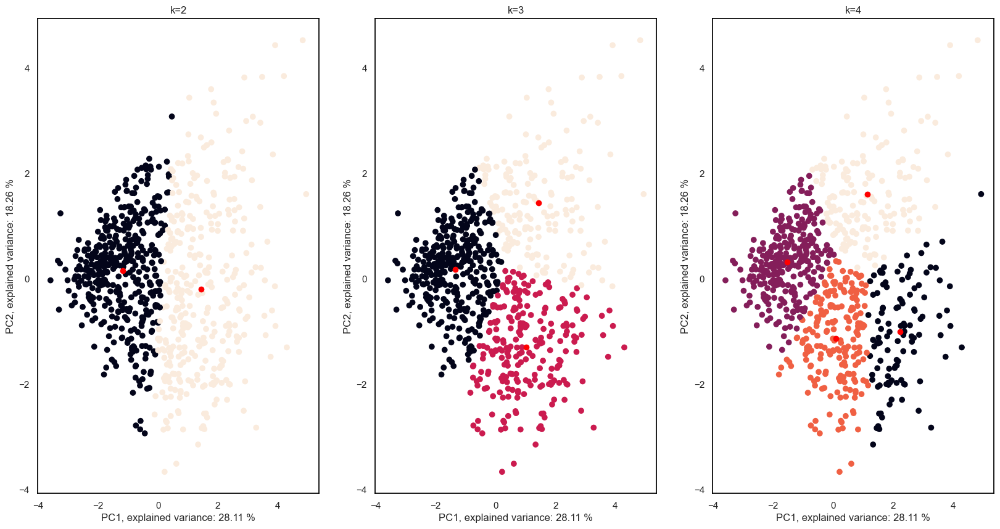

In [40]:
fig, ax = plt.subplots(1,3, figsize=(20,10)) 

X = np.column_stack((principalComponents[:, 0], principalComponents[:, 1]))

for k in [2,3,4]:
    kmeans = KMeans(n_clusters=k).fit(X)
    cluster_labels = kmeans.labels_
    cluster_centers = kmeans.cluster_centers_

    ax[k-2].scatter(principalComponents[:, 0], principalComponents[:, 1], c=cluster_labels)
    ax[k-2].scatter(cluster_centers[:, 0], cluster_centers[:, 1], marker='o', c='red')
    ax[k-2].set_xlabel(f'PC1, explained variance: {explained_variances[0]*100:.2f} %')
    ax[k-2].set_ylabel(f'PC2, explained variance: {explained_variances[1]*100:.2f} %')
    ax[k-2].set_title(f'k={k}')

From the text:

Lastly, importance ranking was used to identify the
features that had the highest mathematical importance to
the outcome.

An example of a post hoc interpreting method is Shapley
Additive exPlanations (SHAP), which is a framework
(based on the idea in game theory of ‘Shapley values’, a
description of a player’s contribution to the result of a
coalitional game) that builds on an additive feature attribution
approach, to generate exclusive interpretation
models that can offer interpretations on a classification
model’s decisions in the form of specific feature contributions
[36]. Benefits of the SHAP framework include a
capability to meet local accuracy as well as consistency.
The SHAP summary plot shows feature importance
ranked in descending order denoted by the y-axis as well as
the effect on how the feature value is associated with the
prediction as denoted by the x-axis, which in turn can be
used to interpret the correlation between a feature and the
outcome [35].

In [41]:
# rpart_importance function in R used for importance ranking analyzes trees 

# does not work with numpy

X_pp = df_pp.loc[:, ~df_pp.columns.isin(['Outcome'])]
y_pp = df.loc[:,['Outcome']]

X_train, X_test, y_train, y_test = train_test_split(X_pp, y_pp, test_size=0.3, random_state=1)

clf = RandomForestClassifier() # n_estimators = 100 by default
clf.fit(X_train, y_train)

# explainer object 
explainer = shap.Explainer(clf.predict, X_train)

# SHAP values for a subset of the data
shap_values = explainer(X_train)

# ExplainerDashboard - build and run
explainer = ClassifierExplainer(clf, X_test, y_test)
dashboard = ExplainerDashboard(explainer, title="My Explainer Dashboard")
dashboard.run()

C:\Users\Ivana\AppData\Local\Temp\ipykernel_16448\4151968895.py:11: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
ExactExplainer explainer: 538it [01:37,  5.41it/s]                                                                     

Detected RandomForestClassifier model: Changing class type to RandomForestClassifierExplainer...
Note: model_output=='probability', so assuming that raw shap output of RandomForestClassifier is in probability space...
Generating self.shap_explainer = shap.TreeExplainer(model)
Building ExplainerDashboard..


Detected notebook environment, consider setting mode='external', mode='inline' or mode='jupyterlab' to keep the notebook interactive while the dashboard is running...
Generating layout...
Calculating shap values...
Calculating prediction probabilities...
Calculating metrics...
Calculating confusion matrices...
Calculating classification_dfs...
Calculating roc auc curves...
Calculating pr auc curves...
Calculating liftcurve_dfs...
Calculating shap interaction values... (this may take a while)
Reminder: TreeShap computational complexity is O(TLD^2), where T is the number of trees, L is the maximum number of leaves in any tree and D the maximal depth of any tree. So reducing these will speed up the calculation.
Calculating dependencies...
Calculating permutation importances (if slow, try setting n_jobs parameter)...
Calculating pred_percentiles...
Calculating predictions...
Calculating ShadowDecTree for each individual decision tree...
Reminder: you can store the explainer (including calc

ConnectionError: HTTPConnectionPool(host='0.0.0.0', port=8050): Max retries exceeded with url: /_alive_2e7b6156-c670-4b9f-9b83-0c9b0c40a85a (Caused by NewConnectionError('<urllib3.connection.HTTPConnection object at 0x00000278EBAD55B0>: Failed to establish a new connection: [WinError 10049] The requested address is not valid in its context'))

My Explainer Dashboard is opened when clicked on http://192.168.42.96:8050

Since there is an error with the connection, I am enclosing screenshots of the results.

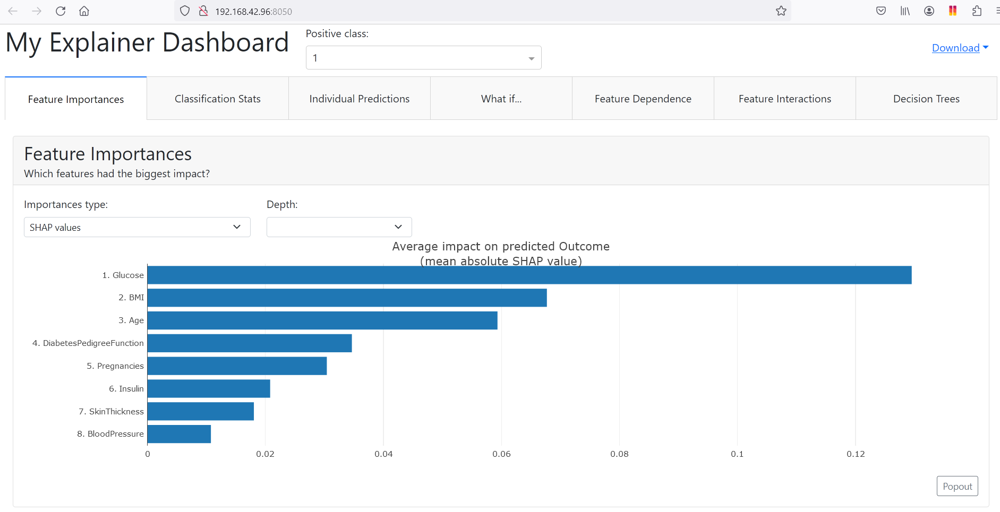

In [43]:
Image(filename="ids_pima_1_new.png")


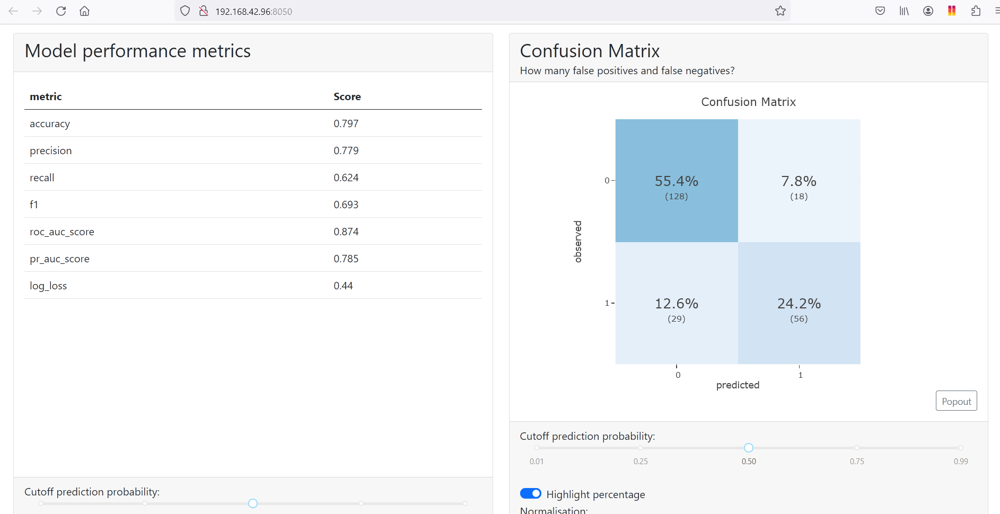

In [44]:
Image(filename="ids_pima_2_new.png")

In [45]:
explainer.plot_importances_detailed(topx=10)

In [46]:
explainer.get_mean_abs_shap_df(cutoff=0.01)

,Feature,MEAN_ABS_SHAP
0,Glucose,0.129512
1,BMI,0.067695
2,Age,0.059325
3,DiabetesPedigreeFunction,0.034653
4,Pregnancies,0.030408
5,Insulin,0.020804
6,SkinThickness,0.018048
7,BloodPressure,0.010767


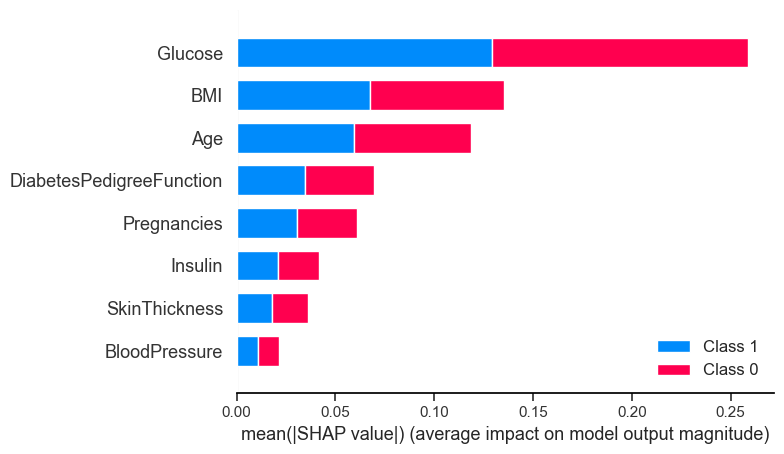

In [47]:
shap_explainer = shap.Explainer(clf)
shap_values = shap_explainer.shap_values(X_test)
shap.summary_plot(shap_values, X_test)

As it can be seen in the results above, the rankings are not as in the paper. In continuation, steps from the paper will be followed.

From the text:

Tree algorithms such as decision trees, Naive Bayes
models, and random forests are not highly sensitive to nonnormalized
data, so **no scaling** was done as a way to keep
the testing similar for the three machine learning models.

The J48 decision tree is an implementation of algorithm
ID3 (Iterative Dichotomiser 3) decision tree, developed by
the WEKA (Java-based ML software) team and included in
R in the package RWeka.


In Python, that would be DecisionTreeClassifier.

In [48]:
X_pp = df_pp.loc[:, ~df_pp.columns.isin(['Outcome'])]
y_pp = df.loc[:,['Outcome']]

y = df_pp.loc[:, ['Outcome']].values


In [49]:
x_3 = df_pp.loc[:, df_pp.columns.isin(['Glucose', 'BMI', 'Age'])].values 
x_5 = df_pp.loc[:, df_pp.columns.isin(['Glucose', 'BMI', 'Age', 'Insulin', 'SkinThickness'])].values

In [60]:
plt.rcParams['axes.grid'] = False

All features

Accuracy: Decision Tree : 0.693
Precision: Decision Tree : 0.592
Recall: Decision Tree : 0.529
Specificity: Decision Tree : 0.788
F-score: Decision Tree : 0.559
AUC score: Decision Tree : 0.659


C:\Users\Ivana\anaconda3\envs\proba1\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Ivana\AppData\Local\Temp\ipykernel_16448\2552826865.py:31: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



Accuracy: Naive Bayes : 0.762
Precision: Naive Bayes : 0.688
Recall: Naive Bayes : 0.647
Specificity: Naive Bayes : 0.829
F-score: Naive Bayes : 0.667
AUC score: Naive Bayes : 0.738
Accuracy: Random Forest : 0.792
Precision: Random Forest : 0.753
Recall: Random Forest : 0.647
Specificity: Random Forest : 0.877
F-score: Random Forest : 0.696
AUC score: Random Forest : 0.762

3 features

Accuracy: Decision Tree : 0.697
Precision: Decision Tree : 0.584
Recall: Decision Tree : 0.612
Specificity: Decision Tree : 0.747
F-score: Decision Tree : 0.598
AUC score: Decision Tree : 0.679


C:\Users\Ivana\anaconda3\envs\proba1\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Ivana\AppData\Local\Temp\ipykernel_16448\2552826865.py:67: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



Accuracy: Naive Bayes : 0.784
Precision: Naive Bayes : 0.754
Recall: Naive Bayes : 0.612
Specificity: Naive Bayes : 0.884
F-score: Naive Bayes : 0.675
AUC score: Naive Bayes : 0.748
Accuracy: Random Forest : 0.766
Precision: Random Forest : 0.687
Recall: Random Forest : 0.671
Specificity: Random Forest : 0.822
F-score: Random Forest : 0.679
AUC score: Random Forest : 0.746

5 features

Accuracy: Decision Tree : 0.719
Precision: Decision Tree : 0.622
Recall: Decision Tree : 0.600
Specificity: Decision Tree : 0.788
F-score: Decision Tree : 0.611
AUC score: Decision Tree : 0.694
Accuracy: Naive Bayes : 0.766
Precision: Naive Bayes : 0.718
Recall: Naive Bayes : 0.600
Specificity: Naive Bayes : 0.863
F-score: Naive Bayes : 0.654
AUC score: Naive Bayes : 0.732


C:\Users\Ivana\anaconda3\envs\proba1\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Ivana\AppData\Local\Temp\ipykernel_16448\2552826865.py:103: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



Accuracy: Random Forest : 0.779
Precision: Random Forest : 0.718
Recall: Random Forest : 0.659
Specificity: Random Forest : 0.849
F-score: Random Forest : 0.687
AUC score: Random Forest : 0.754


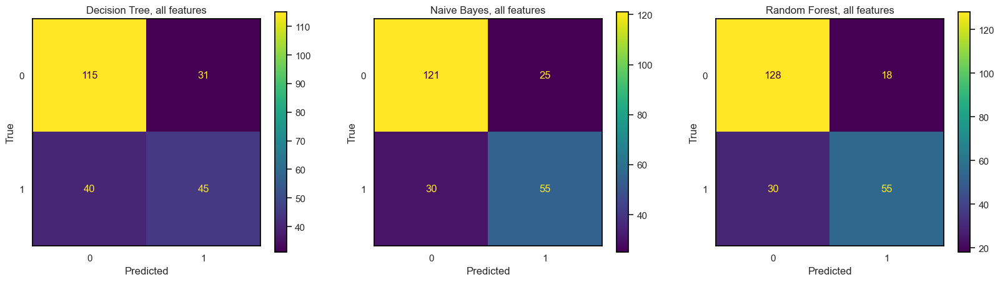

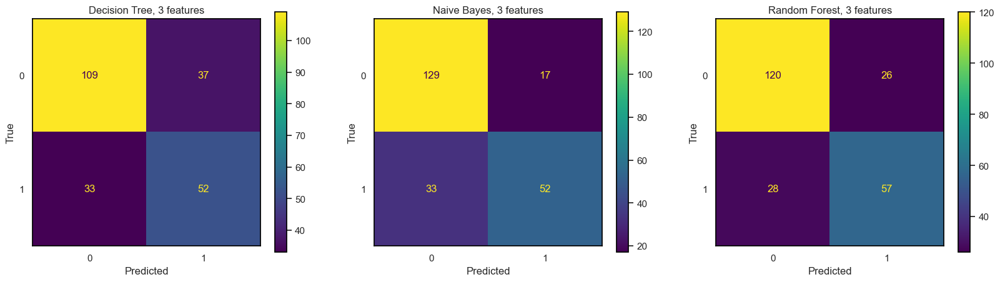

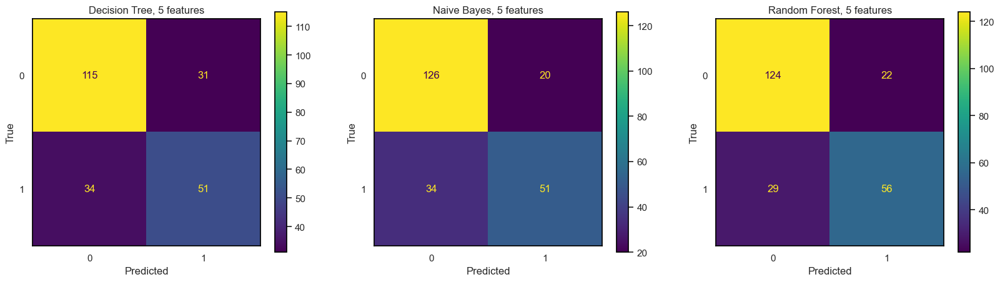

In [65]:
dt = DecisionTreeClassifier(random_state=1)
rf = RandomForestClassifier(random_state=1)
nb = GaussianNB()

acc = {}
prec = {}
rec = {}
spec = {}
f_sc = {}
auc_sc = {}
fpr_d = {}
tpr_d = {}
thresholds_d = {}

classifiers = [('Decision Tree', dt), ('Naive Bayes', nb), ('Random Forest', rf)]

names = ['dt', 'nb', 'rf']


# all features part

X_train, X_test, y_train, y_test = train_test_split(X_pp, y_pp, test_size=0.3, random_state=1)

print('All features\n')

fig, ax = plt.subplots(1, 3, figsize=(20,5))

i=0

for clf_name, clf in classifiers:
    clf.fit(X_train, y_train)
    y_pred = clf.predict(X_test)

    y_pred_prob = clf.predict_proba(X_test)[:,1]
    fpr_d['all_'+names[i]], tpr_d['all_'+names[i]], thresholds_d['all_'+names[i]] = roc_curve(y_test, y_pred_prob)
    
    acc['acc_clf_all_'+names[i]]=accuracy_score(y_test, y_pred)
    prec['prec_clf_all_'+names[i]]=precision_score(y_test, y_pred)
    rec['rec_clf_all_'+names[i]]=recall_score(y_test, y_pred)
    spec['spec_clf_all_'+names[i]]=specificity_score(y_test, y_pred)
    f_sc['spec_clf_all_'+names[i]]=f1_score(y_test,y_pred)
    auc_sc['auc_clf_all_'+names[i]]=roc_auc_score(y_test,y_pred)
    
    print('Accuracy: {:s} : {:.3f}'.format(clf_name, accuracy_score(y_test, y_pred)))
    print('Precision: {:s} : {:.3f}'.format(clf_name, precision_score(y_test, y_pred)))
    print('Recall: {:s} : {:.3f}'.format(clf_name, recall_score(y_test, y_pred)))
    print('Specificity: {:s} : {:.3f}'.format(clf_name, specificity_score(y_test, y_pred)))
    print('F-score: {:s} : {:.3f}'.format(clf_name, f1_score(y_test, y_pred)))
    print('AUC score: {:s} : {:.3f}'.format(clf_name, roc_auc_score(y_test, y_pred)))
    
    cmd = ConfusionMatrixDisplay(confusion_matrix(y_test, y_pred)).plot(ax=ax[i])
    cmd.ax_.set(xlabel='Predicted', ylabel='True', title='{}, all features'.format(clf_name))

    i+=1

# 3 features (Glucose, BMI, Age)
    
X_train, X_test, y_train, y_test = train_test_split(x_3, y_pp, test_size=0.3, random_state=1)

print('\n3 features\n')

fig, ax = plt.subplots(1, 3, figsize=(20,5))

i=0

for clf_name, clf in classifiers:
    clf.fit(X_train, y_train)
    y_pred = clf.predict(X_test)
    
    y_pred_prob = clf.predict_proba(X_test)[:,1]
    fpr_d['three_'+names[i]], tpr_d['three_'+names[i]], thresholds_d['three_'+names[i]] = roc_curve(y_test, y_pred_prob)
    
    acc['acc_clf_3_'+names[i]]=accuracy_score(y_test, y_pred)
    prec['prec_clf_3_'+names[i]]=precision_score(y_test, y_pred)
    rec['rec_clf_3_'+names[i]]=recall_score(y_test, y_pred)
    spec['spec_clf_3_'+names[i]]=specificity_score(y_test, y_pred)
    f_sc['spec_clf_3_'+names[i]]=f1_score(y_test,y_pred)
    auc_sc['auc_clf_3_'+names[i]]=roc_auc_score(y_test,y_pred)
    
    print('Accuracy: {:s} : {:.3f}'.format(clf_name, accuracy_score(y_test, y_pred)))
    print('Precision: {:s} : {:.3f}'.format(clf_name, precision_score(y_test, y_pred)))
    print('Recall: {:s} : {:.3f}'.format(clf_name, recall_score(y_test, y_pred)))
    print('Specificity: {:s} : {:.3f}'.format(clf_name, specificity_score(y_test, y_pred)))
    print('F-score: {:s} : {:.3f}'.format(clf_name, f1_score(y_test, y_pred)))
    print('AUC score: {:s} : {:.3f}'.format(clf_name, roc_auc_score(y_test, y_pred)))
    
    cmd = ConfusionMatrixDisplay(confusion_matrix(y_test, y_pred)).plot(ax=ax[i])
    cmd.ax_.set(xlabel='Predicted', ylabel='True', title='{}, 3 features'.format(clf_name))
    
    i+=1
    
# 5 features (Glucose, BMI, Age, Insulin, Skin Thickness)
    
X_train, X_test, y_train, y_test = train_test_split(x_5, y_pp, test_size=0.3, random_state=1)

print('\n5 features\n')

fig, ax = plt.subplots(1, 3, figsize=(20,5))

i=0

for clf_name, clf in classifiers:
    clf.fit(X_train, y_train)
    y_pred = clf.predict(X_test)
    
    y_pred_prob = clf.predict_proba(X_test)[:,1]
    fpr_d['five_'+names[i]], tpr_d['five_'+names[i]], thresholds_d['five_'+names[i]] = roc_curve(y_test, y_pred_prob)
    
    acc['acc_clf_5_'+names[i]]=accuracy_score(y_test, y_pred)
    prec['prec_clf_5_'+names[i]]=precision_score(y_test, y_pred)
    rec['rec_clf_5_'+names[i]]=recall_score(y_test, y_pred)
    spec['spec_clf_5_'+names[i]]=specificity_score(y_test, y_pred)
    f_sc['spec_clf_5_'+names[i]]=f1_score(y_test,y_pred)
    auc_sc['auc_clf_5_'+names[i]]=roc_auc_score(y_test,y_pred)
    
    print('Accuracy: {:s} : {:.3f}'.format(clf_name, accuracy_score(y_test, y_pred)))
    print('Precision: {:s} : {:.3f}'.format(clf_name, precision_score(y_test, y_pred)))
    print('Recall: {:s} : {:.3f}'.format(clf_name, recall_score(y_test, y_pred)))
    print('Specificity: {:s} : {:.3f}'.format(clf_name, specificity_score(y_test, y_pred)))
    print('F-score: {:s} : {:.3f}'.format(clf_name, f1_score(y_test, y_pred)))
    print('AUC score: {:s} : {:.3f}'.format(clf_name, roc_auc_score(y_test, y_pred)))
    
    cmd = ConfusionMatrixDisplay(confusion_matrix(y_test, y_pred)).plot(ax=ax[i])
    cmd.ax_.set(xlabel='Predicted', ylabel='True', title='{}, 5 features'.format(clf_name))
    
    i+=1


Text(0, 0.5, 'TPR')

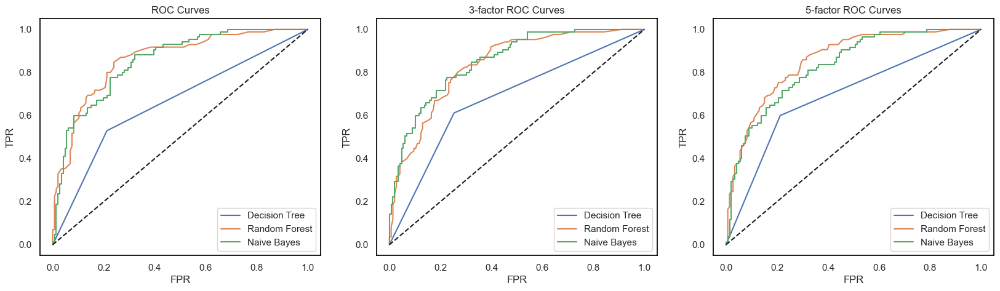

In [66]:
fig, ax = plt.subplots(1,3, figsize=(20,5)) 
    
ax[0].plot(fpr_d['all_dt'], tpr_d['all_dt'], label= "Decision Tree")
ax[0].plot(fpr_d['all_rf'], tpr_d['all_rf'], label= "Random Forest")
ax[0].plot(fpr_d['all_nb'], tpr_d['all_nb'], label= "Naive Bayes")
ax[0].plot([0,1],[0,1], 'k--')
ax[0].legend()
ax[0].set_title('ROC Curves')
ax[0].set_xlabel('FPR')
ax[0].set_ylabel('TPR')

ax[1].plot(fpr_d['three_dt'], tpr_d['three_dt'], label= "Decision Tree")
ax[1].plot(fpr_d['three_rf'], tpr_d['three_rf'], label= "Random Forest")
ax[1].plot(fpr_d['three_nb'], tpr_d['three_nb'], label= "Naive Bayes")
ax[1].plot([0,1],[0,1], 'k--')
ax[1].legend()
ax[1].set_title('3-factor ROC Curves')
ax[1].set_xlabel('FPR')
ax[1].set_ylabel('TPR')

ax[2].plot(fpr_d['five_dt'], tpr_d['five_dt'], label= "Decision Tree")
ax[2].plot(fpr_d['five_rf'], tpr_d['five_rf'], label= "Random Forest")
ax[2].plot(fpr_d['five_nb'], tpr_d['five_nb'], label= "Naive Bayes")
ax[2].plot([0,1],[0,1], 'k--')
ax[2].legend()
ax[2].set_title('5-factor ROC Curves')
ax[2].set_xlabel('FPR')
ax[2].set_ylabel('TPR')


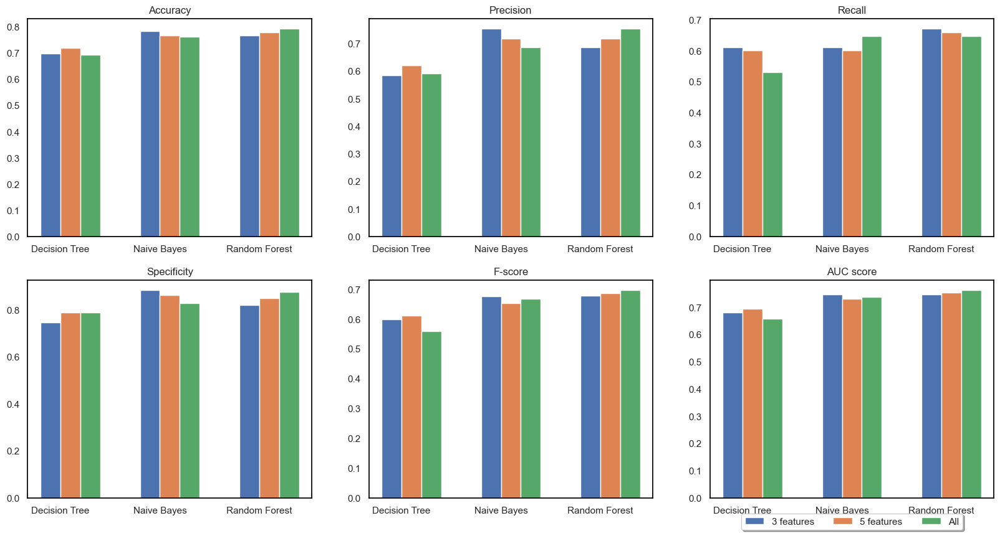

In [74]:
fig, ax = plt.subplots(2, 3, figsize=(20,10))

X = ['Decision Tree', 'Naive Bayes', 'Random Forest']

X_axis = np.arange(len(X)) 

ax[0,0].bar(X_axis - 0.1, [value for key, value in acc.items() if '3' in key.lower()], 0.2, label = '3 features')
ax[0,0].bar(X_axis + 0.1, [value for key, value in acc.items() if '5' in key.lower()], 0.2, label = '5 features')
ax[0,0].bar(X_axis + 0.3, [value for key, value in acc.items() if 'all' in key.lower()], 0.2, label = 'All')
ax[0,0].set_xticks(X_axis, X) 
ax[0,0].set_title("Accuracy")  

ax[0,1].bar(X_axis - 0.1, [value for key, value in prec.items() if '3' in key.lower()], 0.2, label = '3 features')
ax[0,1].bar(X_axis + 0.1, [value for key, value in prec.items() if '5' in key.lower()], 0.2, label = '5 features')
ax[0,1].bar(X_axis + 0.3, [value for key, value in prec.items() if 'all' in key.lower()], 0.2, label = 'All')
ax[0,1].set_xticks(X_axis, X) 
ax[0,1].set_title("Precision") 

ax[0,2].bar(X_axis - 0.1, [value for key, value in rec.items() if '3' in key.lower()], 0.2, label = '3 features')
ax[0,2].bar(X_axis + 0.1, [value for key, value in rec.items() if '5' in key.lower()], 0.2, label = '5 features')
ax[0,2].bar(X_axis + 0.3, [value for key, value in rec.items() if 'all' in key.lower()], 0.2, label = 'All')
ax[0,2].set_xticks(X_axis, X) 
ax[0,2].set_title("Recall") 

ax[1,0].bar(X_axis - 0.1, [value for key, value in spec.items() if '3' in key.lower()], 0.2, label = '3 features')
ax[1,0].bar(X_axis + 0.1, [value for key, value in spec.items() if '5' in key.lower()], 0.2, label = '5 features')
ax[1,0].bar(X_axis + 0.3, [value for key, value in spec.items() if 'all' in key.lower()], 0.2, label = 'All')
ax[1,0].set_xticks(X_axis, X) 
ax[1,0].set_title("Specificity") 

ax[1,1].bar(X_axis - 0.1, [value for key, value in f_sc.items() if '3' in key.lower()], 0.2, label = '3 features')
ax[1,1].bar(X_axis + 0.1, [value for key, value in f_sc.items() if '5' in key.lower()], 0.2, label = '5 features')
ax[1,1].bar(X_axis + 0.3, [value for key, value in f_sc.items() if 'all' in key.lower()], 0.2, label = 'All')
ax[1,1].set_xticks(X_axis, X) 
ax[1,1].set_title("F-score") 
   
ax[1,2].bar(X_axis - 0.1, [value for key, value in auc_sc.items() if '3' in key.lower()], 0.2, label = '3 features')
ax[1,2].bar(X_axis + 0.1, [value for key, value in auc_sc.items() if '5' in key.lower()], 0.2, label = '5 features')
ax[1,2].bar(X_axis + 0.3, [value for key, value in auc_sc.items() if 'all' in key.lower()], 0.2, label = 'All')
ax[1,2].set_xticks(X_axis, X) 
ax[1,2].set_title("AUC score") 

plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.05),
          fancybox=True, shadow=True, ncol=5)